# Sydney Airbnb Data Exploration
## by Hao Xu

## Preliminary Wrangling


This document explores **Sydney Airbnb Dataset**. 


In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import geopandas as gpd
import descartes
from shapely.geometry import Point, Polygon
import contextily as ctx

import re
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

%matplotlib inline


In [2]:
# load the listing summary dataset
sl_df = pd.read_csv('sydney_listings_summary_dec18.csv')
print(sl_df.shape)
sl_df.head()

(36662, 16)


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,12351,Sydney City & Harbour at the door,17061,Stuart,NaN,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187
1,14250,Manly Harbour House,55948,Heidi,NaN,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321
2,15253,Stunning Penthouse Apartment In Heart Of The City,59850,Morag,NaN,Sydney,-33.880455,151.216541,Private room,109,2,300,2018-11-16,3.63,2,316
3,20865,3 BED HOUSE + 1 BED STUDIO Balmain,64282,Fiona,NaN,Leichhardt,-33.859072,151.172753,Entire home/apt,450,7,15,2018-01-07,0.18,1,69
4,26174,"COZY PRIVATE ROOM, GREAT LOCATION!",110561,Amanda,NaN,Woollahra,-33.889087,151.259404,Private room,62,1,42,2018-11-23,0.45,1,140


In [3]:
print(sl_df.dtypes)
sl_df.isnull().sum()

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object


id                                    0
name                                 12
host_id                               0
host_name                             6
neighbourhood_group               36662
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       11937
reviews_per_month                 11937
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [4]:
# convert 'last_review' datatype to datetime
sl_df.last_review = sl_df.last_review.astype("datetime64")
# drop neighbourhood_group for all values are null
sl_df.drop(columns = {'neighbourhood_group'}, inplace = True)

In [5]:
# load the calendar summary dataset
sc_df = pd.read_csv('sydney_calendar_dec18.csv')
print(sc_df.shape)
sc_df.head()

(13381265, 4)


,listing_id,date,available,price
0,14250,2019-12-06,t,$470.00
1,12351,2019-08-17,t,$110.00
2,12351,2019-08-16,t,$110.00
3,12351,2019-08-15,t,$110.00
4,12351,2019-08-14,t,$110.00


In [6]:
print(sc_df.dtypes)
sc_df.isnull().sum()

listing_id     int64
date          object
available     object
price         object
dtype: object


listing_id          0
date                0
available           0
price         9810841
dtype: int64

In [7]:
sc_df.date = sc_df.date.astype("datetime64")
sc_df.available = sc_df.available.apply(lambda x : 1 if x == 't' else 0)

In [8]:
def getnum(price):
    if type(price) != str:
        return price
    else:
        return ''.join(price[1:].split(','))

sc_df.price = sc_df.price.apply(getnum)
sc_df.price = sc_df.price.apply(float)

In [407]:
sr_df = pd.read_csv('sydney_reviews_dec18.csv')
print(sr_df.shape)
sr_df.head()

(446708, 6)


,listing_id,id,date,reviewer_id,reviewer_name,comments
0,12351,68394,2010-07-24,45760,Anna,This was my first Airbnb experience and I am h...
1,12351,76453,2010-08-09,148786,Stuart,"As my first AirBnB experience, this was a magn..."
2,12351,83283,2010-08-23,190202,Angel,Like many others this was my first AirBnB expe...
3,12351,91580,2010-09-06,219308,Meisy,"Vinh and Stuart were very warm and hospitable,..."
4,12351,100903,2010-09-20,191976,Dayna,I had a wonderful experience staying with Vinh...


In [408]:
print(sr_df.dtypes)
sr_df.isnull().sum()

listing_id        int64
id                int64
date             object
reviewer_id       int64
reviewer_name    object
comments         object
dtype: object


listing_id         0
id                 0
date               0
reviewer_id        0
reviewer_name      0
comments         447
dtype: int64

In [409]:
sr_df.date = sr_df.date.astype("datetime64")

### What is the structure of the dataset?




### My most interesting questions

1. Is room type and host listing counts has any regional distribution pattern? 
2. What's the trend of availabel room quantity and price with in a year?
3. What factors affect the house price more?
4. What are several words most used by reviewers to discribe every neighbourhood?

### 1. Is room type and host listing counts has any regional distribution pattern?

In [13]:
# set a new column, if owner only has this one room, marked as low
# if owner has 2 to 4 rooms('calculated_host_listings_count' is 2 to 4), marker as medium,
# if owner has more than 4 rooms, marker as high
def L_to_H(count):
    if count == 1:
        return 'Low'
    if count >=2 and count<=4:
        return 'Medium'
    if count >= 5:
        return 'High'

sl_df['owner_own_rooms'] = sl_df['calculated_host_listings_count'].apply(L_to_H)

In [283]:
# set the new column to orered categorical type
order = ['Low','Medium','High']
ordered_var = pd.api.types.CategoricalDtype(ordered = True, categories = order)
sl_df['owner_own_rooms'] = sl_df['owner_own_rooms'].astype(ordered_var)

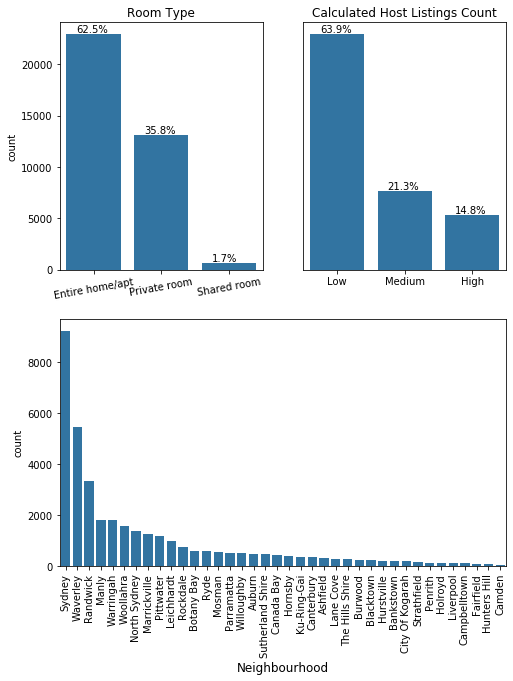

In [309]:
# take a look at the univariate distribution of 3 features(neighbourhood,room_type and calculated_host_listings_count)
base_color = sns.color_palette()[0]
plt.figure(figsize = [8,10])

plt.subplot(2,2, 1)
sns.countplot(data = sl_df, x = 'room_type',color = base_color,
              order = sl_df.room_type.value_counts().index)
plt.title('Room Type')
plt.xlabel('')
plt.xticks(rotation = 10)
for i in range (3):
    count = sl_df.room_type.value_counts()[i]
    pct_string = '{:.1%}'.format(count/sl_df.shape[0])
    plt.text(i-0.25,count+200,pct_string, va = 'baseline',fontsize = 10);

plt.subplot(2, 2, 2)
sns.countplot(data = sl_df, x = 'owner_own_rooms',color = base_color,
              order =sl_df.owner_own_rooms.value_counts().index) 
plt.title('Calculated Host Listings Count')
plt.xlabel('')
plt.ylabel('')
plt.yticks([])
for i in range (3):
    count = sl_df.owner_own_rooms.value_counts()[i]
    pct_string = '{:.1%}'.format(count/sl_df.shape[0])
    plt.text(i-0.25,count+200,pct_string, va = 'baseline',fontsize = 10);

plt.subplot(2, 2, (3,4))
sns.countplot(data = sl_df, x = 'neighbourhood',color = base_color,
              order = sl_df.neighbourhood.value_counts().index)
plt.xticks(rotation = 90)
plt.xlabel('Neighbourhood',fontsize = 12)
plt.show();



Most of the room types are Entire home and Private room, only 1.7% is shared room.

Most of the owners only have one airbnb house.

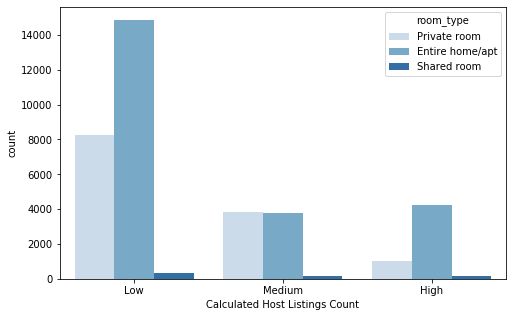

In [310]:
## room type vs host count

plt.figure(figsize = [8, 5])

sns.countplot(data = sl_df, x = 'owner_own_rooms', hue = 'room_type', palette = 'Blues')
plt.xlabel('Calculated Host Listings Count')
plt.show();

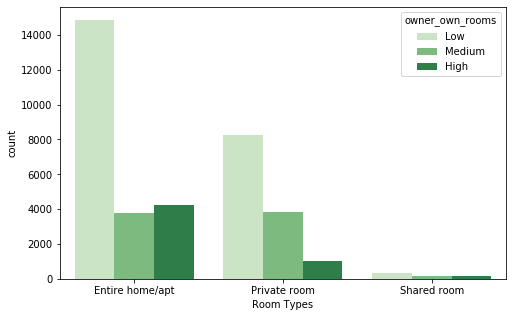

In [311]:
## host count vs room type

plt.figure(figsize = [8, 5])

sns.countplot(data = sl_df, x = 'room_type', hue = 'owner_own_rooms', palette = 'Greens',
              order = sl_df.room_type.value_counts().index)
plt.xlabel('Room Types')
plt.show();

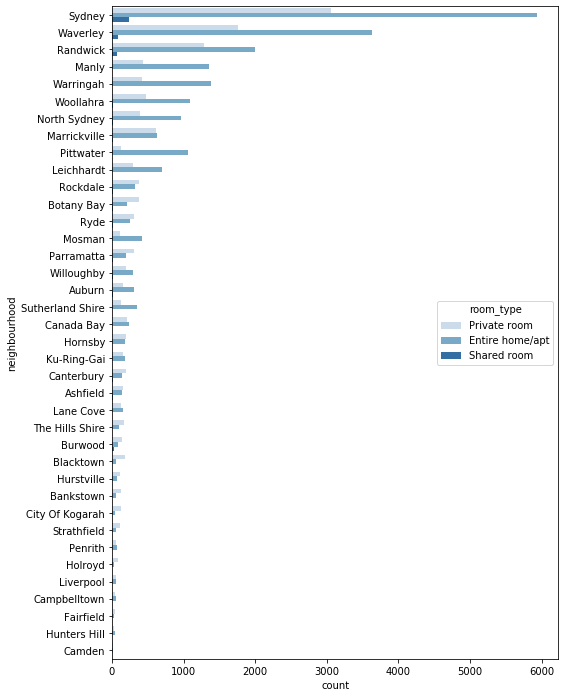

In [288]:
# room type vs host count

plt.figure(figsize = [8, 12])

sns.countplot(data = sl_df, y = 'neighbourhood', hue = 'room_type', palette = 'Blues',
              order = sl_df.neighbourhood.value_counts().index)
plt.show();

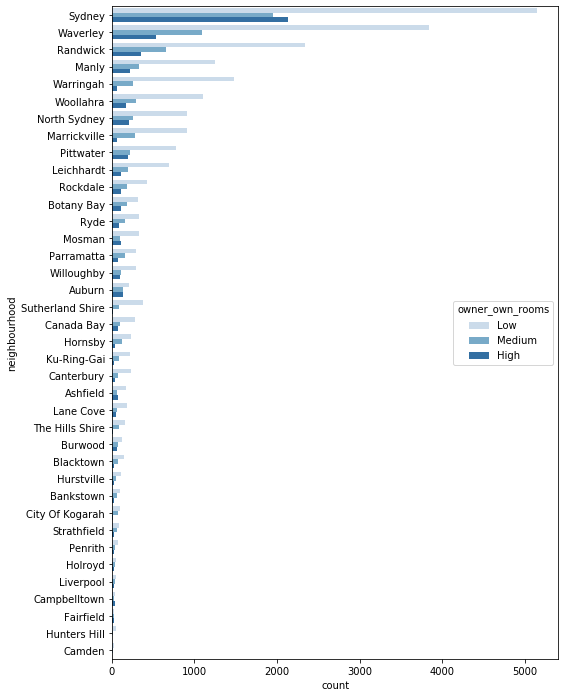

In [289]:
# room type vs host count

plt.figure(figsize = [8, 12])

sns.countplot(data = sl_df, y = 'neighbourhood', hue = 'owner_own_rooms', palette = 'Blues',
              order = sl_df.neighbourhood.value_counts().index)
plt.show();

In [117]:
syd_poas = aus_poas.query('code>= 2000 & code <= 3000 ')
syd_poas.crs = {'init' :'epsg:4326'}
print(syd_poas.crs)
syd_poas.head()

{'init': 'epsg:4326'}


,POA_NAME,code,state,geometry
510,2648,2648,None,"POLYGON ((141.15285 -34.07935, 141.15286 -34.0..."
511,2717,2717,None,"POLYGON ((142.02848 -34.12087, 142.02849 -34.1..."
512,2735,2735,None,"POLYGON ((143.59179 -35.07012, 143.59177 -35.0..."
513,2736,2736,None,"POLYGON ((143.33290 -35.02792, 143.33290 -35.0..."
514,2737,2737,None,"POLYGON ((142.69939 -34.60174, 142.69941 -34.6..."


In [280]:
aus_poas = gpd.read_file('aus_poas.shp')
syd_poas = aus_poas.query('code>= 2000 & code <= 3000 ')
syd_poas.crs = {'init' :'epsg:4326'};

In [95]:
geometry = [Point(xy) for xy in zip(sl_df['longitude'],sl_df['latitude'])]
crs = {'init':'epsg:4326'}

geo_df = gpd.GeoDataFrame(sl_df,crs = crs, geometry = geometry)
geo_df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,owner_own_rooms,geometry
0,12351,Sydney City & Harbour at the door,17061,Stuart,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187,Medium,POINT (151.19190 -33.86515)
1,14250,Manly Harbour House,55948,Heidi,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321,Medium,POINT (151.26172 -33.80093)
2,15253,Stunning Penthouse Apartment In Heart Of The City,59850,Morag,Sydney,-33.880455,151.216541,Private room,109,2,300,2018-11-16,3.63,2,316,Medium,POINT (151.21654 -33.88045)
3,20865,3 BED HOUSE + 1 BED STUDIO Balmain,64282,Fiona,Leichhardt,-33.859072,151.172753,Entire home/apt,450,7,15,2018-01-07,0.18,1,69,Low,POINT (151.17275 -33.85907)
4,26174,"COZY PRIVATE ROOM, GREAT LOCATION!",110561,Amanda,Woollahra,-33.889087,151.259404,Private room,62,1,42,2018-11-23,0.45,1,140,Low,POINT (151.25940 -33.88909)


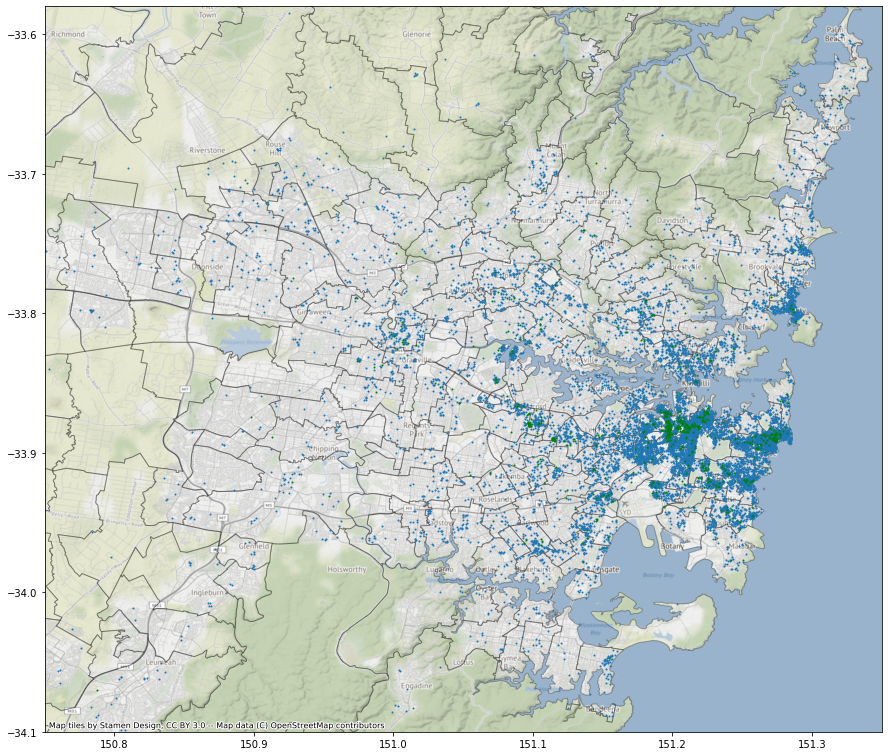

In [320]:

fig,ax = plt.subplots(figsize = (15,15))
syd_poas.plot(ax = ax, alpha = 0.3,color= 'white', edgecolor='k')
plt.scatter(data = geo_df[geo_df['room_type'] == 'Private room'], x = 'longitude', y = 'latitude', s = 1,alpha= 1)
#plt.scatter(data = geo_df[geo_df['room_type'] == 'Entire home/apt'], x = 'longitude', y = 'latitude', c= 'red',s = 1,alpha= 0.3)
plt.scatter(data = geo_df[geo_df['room_type'] == 'Shared room'], x = 'longitude', y = 'latitude', c= 'green',s = 1)
plt.xlim(150.75,151.35)
plt.ylim(-34.1,-33.58)
ctx.add_basemap(ax, crs=aus_poas.crs,zoom=12);


The vast majority of the Airbnb properties are located along the west coast and around the Syndey harber waters. In the inner of Sydney, Airbnb properties locations are following the train line, such as T1(from from North Sydney to Hornsby) and T2(from Central to Parramatta).

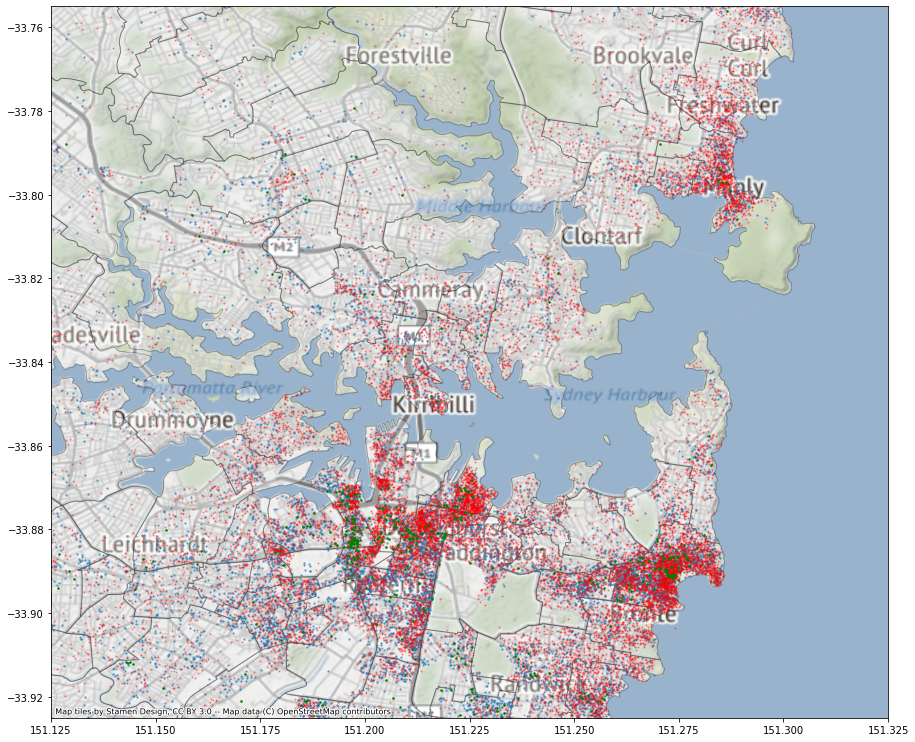

In [315]:
fig,ax = plt.subplots(figsize = (15,15))
syd_poas.plot(ax = ax, alpha = 0.3,color= 'white', edgecolor='k')
plt.scatter(data = geo_df[geo_df['room_type'] == 'Private room'], x = 'longitude', y = 'latitude', s = 2,alpha= 0.5)
plt.scatter(data = geo_df[geo_df['room_type'] == 'Entire home/apt'], x = 'longitude', y = 'latitude', c= 'red',s = 1.5,alpha= 0.3)
plt.scatter(data = geo_df[geo_df['room_type'] == 'Shared room'], x = 'longitude', y = 'latitude', c= 'green',s = 2.2)
plt.xlim(151.125,151.325)
plt.ylim(-33.925,-33.755)
ctx.add_basemap(ax, crs=aus_poas.crs,zoom=12);

After focusing on the core area of Sydeny, Airbnb properties highly clustered in three areas, around CBD, around Bondi beach and around Manly beach. They are the most popular area of Sydney for the tourists, and there are a lot of apartments.

In [119]:
syd_poas.crs

{'init': 'epsg:4326'}

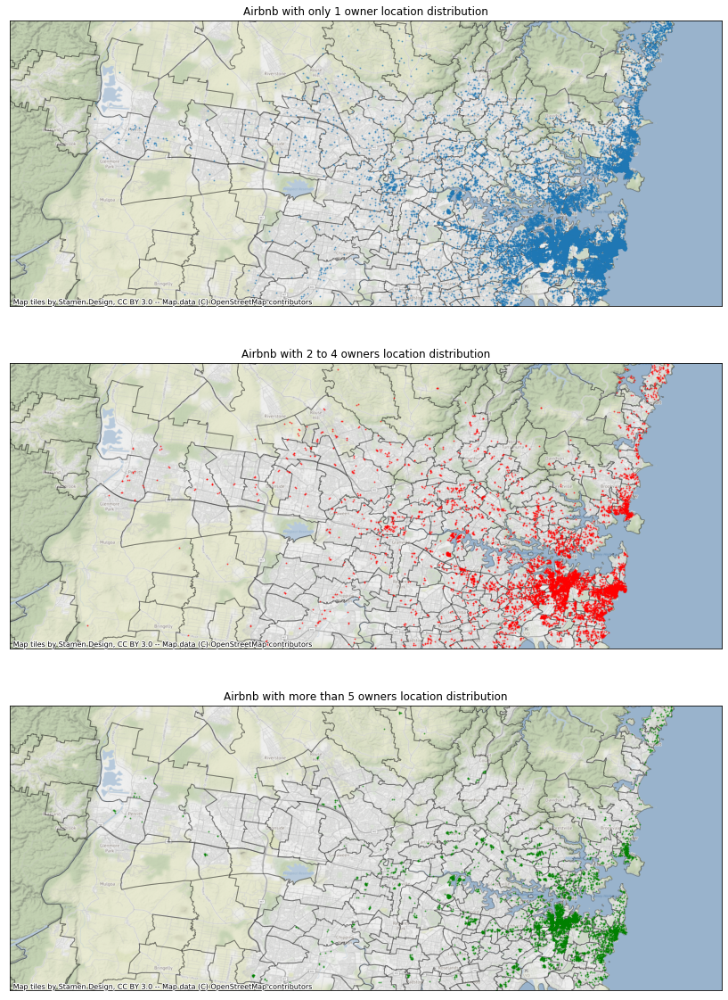

In [329]:
fig,ax = plt.subplots(3,1,figsize = (15,20))
syd_poas.plot(ax = ax[0], alpha = 0.3,color= 'white', edgecolor='k')
ax[0].scatter(data = geo_df[geo_df['owner_own_rooms'] == 'Low'], x = 'longitude', y = 'latitude', s = 1,alpha= 0.5)
ax[0].set_xlim(150.55,151.4)
ax[0].set_ylim(-33.96,-33.62)
ctx.add_basemap(ax[0], crs={'init': 'epsg:4326'}, zoom=12)
ax[0].set_title('Airbnb with only 1 owner location distribution')
ax[0].set_xticks([])
ax[0].set_yticks([]);

syd_poas.plot(ax = ax[1], alpha = 0.3,color= 'white', edgecolor='k')
ax[1].scatter(data = geo_df[geo_df['owner_own_rooms'] == 'Medium'], x = 'longitude', y = 'latitude', c= 'red',s = 1,alpha= 0.5)
ax[1].set_xlim(150.55,151.4)
ax[1].set_ylim(-33.96,-33.62)
ctx.add_basemap(ax[1], crs={'init': 'epsg:4326'}, zoom=12)
ax[1].set_title('Airbnb with 2 to 4 owners location distribution')
ax[1].set_xticks([])
ax[1].set_yticks([]);

syd_poas.plot(ax = ax[2], alpha = 0.3,color= 'white', edgecolor='k')
ax[2].scatter(data = geo_df[geo_df['owner_own_rooms'] == 'High'], x = 'longitude', y = 'latitude', c= 'green',s = 1,alpha= 0.5)
ax[2].set_xlim(150.55,151.4)
ax[2].set_ylim(-33.96,-33.62)
ctx.add_basemap(ax[2], crs={'init': 'epsg:4326'}, zoom=12);
ax[2].set_title('Airbnb with more than 5 owners location distribution')
ax[2].set_xticks([])
ax[2].set_yticks([]);


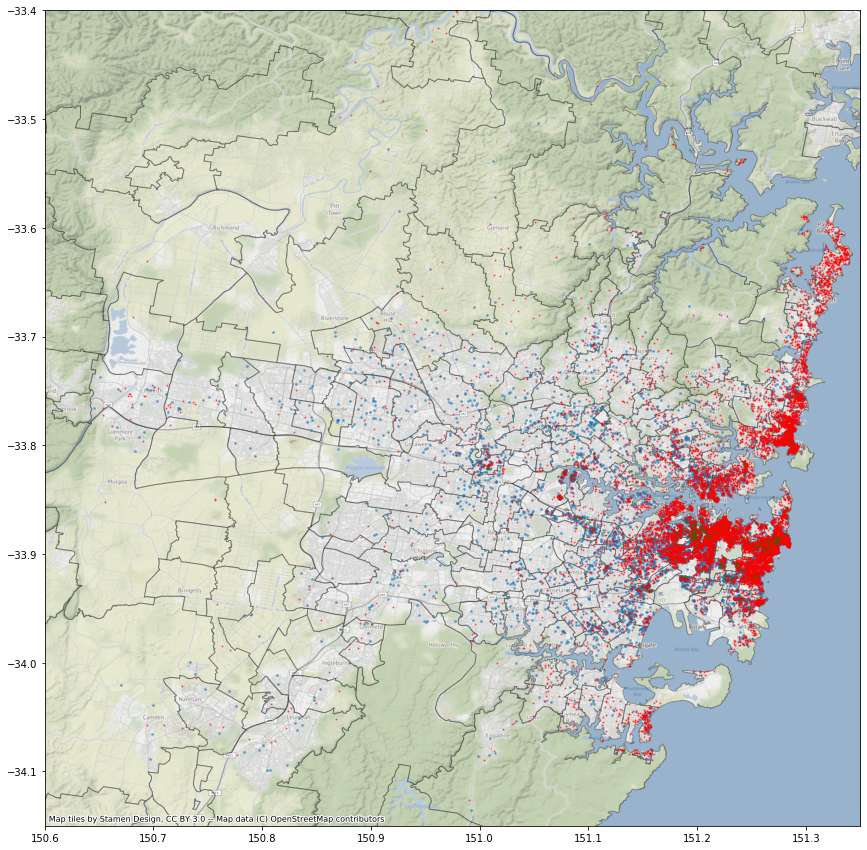

In [144]:
fig,ax = plt.subplots(figsize = (15,15))
syd_poas.plot(ax = ax, alpha = 0.3,color= 'white', edgecolor='k')
plt.scatter(data = geo_df.query('owner_own_rooms == "Low" & room_type == "Private room"'), x = 'longitude', y = 'latitude', s = 3,alpha= 0.5)
plt.scatter(data = geo_df.query('owner_own_rooms == "Low" & room_type == "Entire home/apt"'), x = 'longitude', y = 'latitude', c= 'red',s = 1,alpha= 0.5)
plt.scatter(data = geo_df.query('owner_own_rooms == "Low" & room_type == "Shared room"'), x = 'longitude', y = 'latitude', c= 'green',s = 1,alpha= 0.5)
plt.xlim(150.6,151.35)
plt.ylim(-34.15,-33.4)
ctx.add_basemap(ax, crs={'init': 'epsg:4326'}, zoom=12);



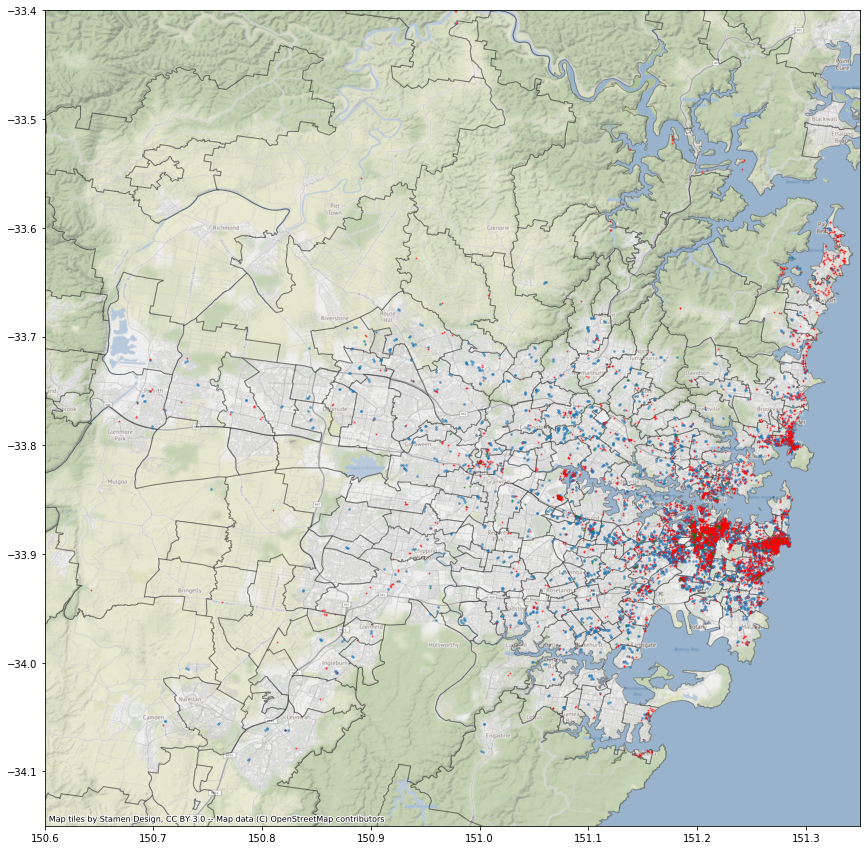

In [145]:
fig,ax = plt.subplots(figsize = (15,15))
syd_poas.plot(ax = ax, alpha = 0.3,color= 'white', edgecolor='k')
plt.scatter(data = geo_df.query('owner_own_rooms == "Medium" & room_type == "Private room"'), x = 'longitude', y = 'latitude', s = 3,alpha= 0.5)
plt.scatter(data = geo_df.query('owner_own_rooms == "Medium" & room_type == "Entire home/apt"'), x = 'longitude', y = 'latitude', c= 'red',s = 1,alpha= 0.5)
plt.scatter(data = geo_df.query('owner_own_rooms == "Medium" & room_type == "Shared room"'), x = 'longitude', y = 'latitude', c= 'green',s = 1,alpha= 0.5)
plt.xlim(150.6,151.35)
plt.ylim(-34.15,-33.4)
ctx.add_basemap(ax, crs={'init': 'epsg:4326'}, zoom=12);



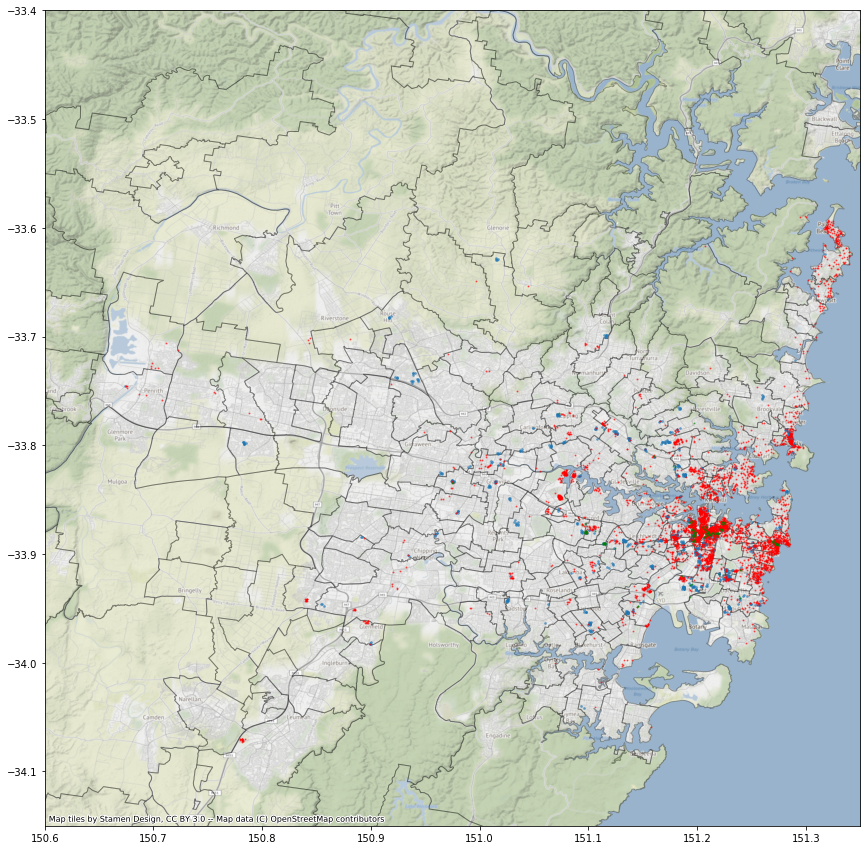

In [146]:
fig,ax = plt.subplots(figsize = (15,15))
syd_poas.plot(ax = ax, alpha = 0.3,color= 'white', edgecolor='k')
plt.scatter(data = geo_df.query('owner_own_rooms == "High" & room_type == "Private room"'), x = 'longitude', y = 'latitude', s = 3,alpha= 0.5)
plt.scatter(data = geo_df.query('owner_own_rooms == "High" & room_type == "Entire home/apt"'), x = 'longitude', y = 'latitude', c= 'red',s = 1,alpha= 0.5)
plt.scatter(data = geo_df.query('owner_own_rooms == "High" & room_type == "Shared room"'), x = 'longitude', y = 'latitude', c= 'green',s = 1,alpha= 0.5)
plt.xlim(150.6,151.35)
plt.ylim(-34.15,-33.4)
ctx.add_basemap(ax, crs={'init': 'epsg:4326'}, zoom=12);



### 2. What's the trend of availabel room quantity and price with in a year?

In [245]:
# use datetime as index for better time series analysis
sc_df.set_index('date',inplace = True)
sc_df

,listing_id,available,price
date,,,
2019-12-06,14250,1,470.0
2019-08-17,12351,1,110.0
2019-08-16,12351,1,110.0
2019-08-15,12351,1,110.0
2019-08-14,12351,1,110.0
...,...,...,...
2018-12-11,30540048,0,NaN
2018-12-10,30540048,0,NaN
2018-12-09,30540048,0,NaN


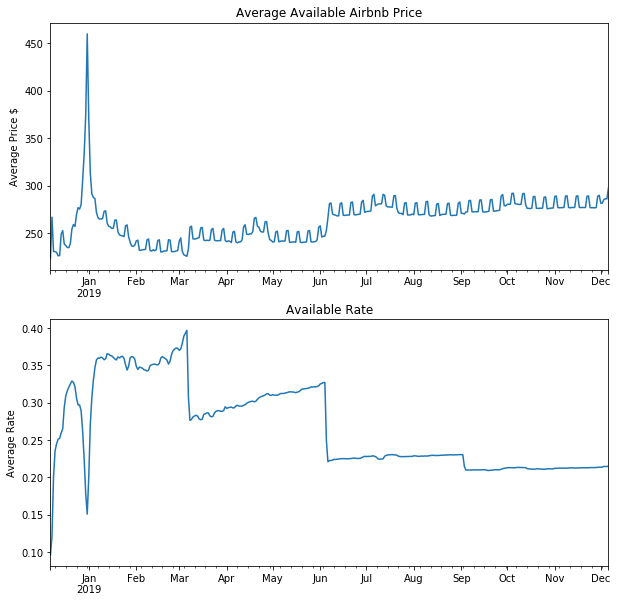

In [396]:
fig,ax = plt.subplots(2,1,figsize = (10,10))
sc_df.resample('D').price.mean().plot(ax = ax[0],kind='line')
ax[0].set_title('Average Available Airbnb Price')
ax[0].set_ylabel('Average Price $')
ax[0].set_xlabel('')

sc_df.resample('D').available.mean().plot(ax = ax[1], kind='line')
ax[1].set_title('Available Rate')
ax[1].set_ylabel('Average Rate')
ax[1].set_xlabel('')

plt.show();

In most travel websites, the best times to visit Sydney are September through November and from March to May.

In [411]:
sub_list = sl_df.neighbourhood.value_counts().index

# separate the neighbourhood into two parts from Ryde, neighbourhood before Ryde are mostly for
# tourists, neighbourhood after Ryde are most for business and other
sub_H = sub_list[:3]
sub_L = sub_list[3:]

# get the id list of both neighbourhood parts
id_H =sl_df.query('neighbourhood in @sub_H').id.value_counts().index
id_L =sl_df.query('neighbourhood in @sub_L').id.value_counts().index 

sc_df_H = sc_df.query('listing_id in @id_H')
sc_df_L = sc_df.query('listing_id in @id_L')

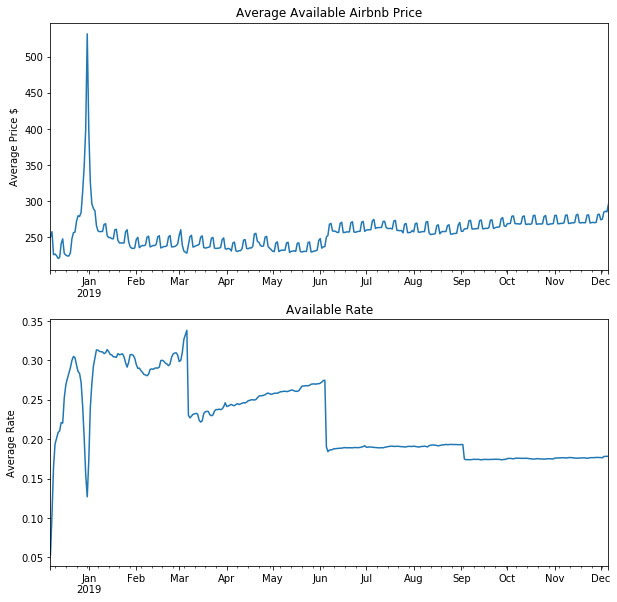

In [397]:
fig,ax = plt.subplots(2,1,figsize = (10,10))
sc_df_H.resample('D').price.mean().plot(ax = ax[0],kind='line')
ax[0].set_title('Average Available Airbnb Price')
ax[0].set_ylabel('Average Price $')
ax[0].set_xlabel('')

sc_df_H.resample('D').available.mean().plot(ax = ax[1], kind='line')
ax[1].set_title('Available Rate')
ax[1].set_ylabel('Average Rate')
ax[1].set_xlabel('')

plt.show();

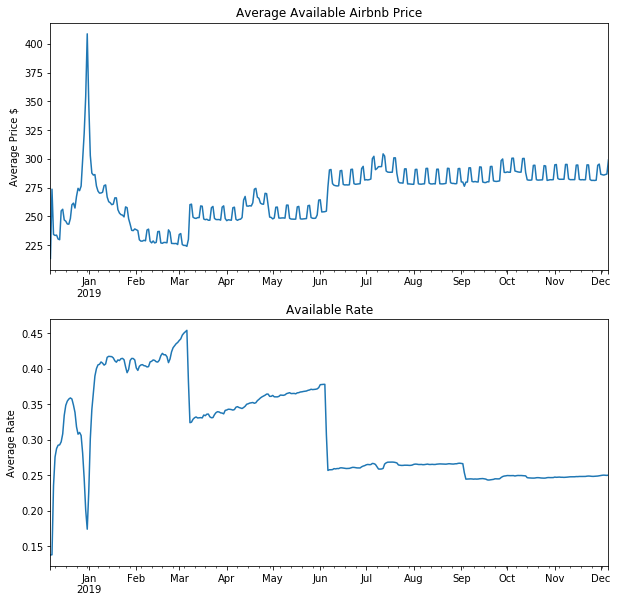

In [398]:
fig,ax = plt.subplots(2,1,figsize = (10,10))
sc_df_L.resample('D').price.mean().plot(ax = ax[0],kind='line')
ax[0].set_title('Average Available Airbnb Price')
ax[0].set_ylabel('Average Price $')
ax[0].set_xlabel('')

sc_df_L.resample('D').available.mean().plot(ax = ax[1], kind='line')
ax[1].set_title('Available Rate')
ax[1].set_ylabel('Average Rate')
ax[1].set_xlabel('')

plt.show();

### 4. What are several words most used by reviewers to discribe every neighbourhood?

In [410]:
id_sub_df = sl_df[['id','neighbourhood']]
sr_df = sr_df.merge(id_sub_df,left_on = 'listing_id', right_on = 'id')



,listing_id,id_x,date,reviewer_id,reviewer_name,comments,id_y,neighbourhood
0,12351,68394,2010-07-24,45760,Anna,This was my first Airbnb experience and I am h...,12351,Sydney
1,12351,76453,2010-08-09,148786,Stuart,"As my first AirBnB experience, this was a magn...",12351,Sydney
2,12351,83283,2010-08-23,190202,Angel,Like many others this was my first AirBnB expe...,12351,Sydney
3,12351,91580,2010-09-06,219308,Meisy,"Vinh and Stuart were very warm and hospitable,...",12351,Sydney
4,12351,100903,2010-09-20,191976,Dayna,I had a wonderful experience staying with Vinh...,12351,Sydney
...,...,...,...,...,...,...,...,...
446703,30536305,355879060,2018-12-06,70738238,Alex,The host canceled this reservation 17 days bef...,30536305,Ku-Ring-Gai
446704,30538385,355740278,2018-12-05,118049265,Hendri,The host canceled this reservation 26 days bef...,30538385,Sydney
446705,30540300,355866031,2018-12-06,135851272,Nicky,The host canceled this reservation 23 days bef...,30540300,Sydney
446706,30546606,355843592,2018-12-06,95496376,Yi-Chan,The host canceled this reservation 24 days bef...,30546606,The Hills Shire


In [412]:
sub_list

Index(['Sydney', 'Waverley', 'Randwick', 'Manly', 'Warringah', 'Woollahra',
       'North Sydney', 'Marrickville', 'Pittwater', 'Leichhardt', 'Rockdale',
       'Botany Bay', 'Ryde', 'Mosman', 'Parramatta', 'Willoughby', 'Auburn',
       'Sutherland Shire', 'Canada Bay', 'Hornsby', 'Ku-Ring-Gai',
       'Canterbury', 'Ashfield', 'Lane Cove', 'The Hills Shire', 'Burwood',
       'Blacktown', 'Hurstville', 'Bankstown', 'City Of Kogarah',
       'Strathfield', 'Penrith', 'Holroyd', 'Liverpool', 'Campbelltown',
       'Fairfield', 'Hunters Hill', 'Camden'],
      dtype='object')

In [423]:
sr_df['comments'] = sr_df['comments'].astype(str)

In [441]:
x = sr_df[sr_df['neighbourhood'] == 'Ryde'][:10000]
x.shape

(5288, 8)

In [518]:
# get the list of most used 100 words by reviewers for every neighbourhood, and form a dict,
# using the surburb name as the key, word list as values.
r = re.compile('[a-z]+')
sw = stopwords.words('english')
stemmer = SnowballStemmer('english')

sub_dic = {}
for sub in sub_list:
    all_word = r.findall(" ".join(sr_df[sr_df['neighbourhood'] == sub]["comments"]).lower())
    stem_word = [stemmer.stem(i) for i in all_word if i not in sw]
    words,count = zip(*Counter(stem_word).most_common(100))
    sub_dic[sub] = list(words)
    print(sub)

Sydney
Waverley
Randwick
Manly
Warringah
Woollahra
North Sydney
Marrickville
Pittwater
Leichhardt
Rockdale
Botany Bay
Ryde
Mosman
Parramatta
Willoughby
Auburn
Sutherland Shire
Canada Bay
Hornsby
Ku-Ring-Gai
Canterbury
Ashfield
Lane Cove
The Hills Shire
Burwood
Blacktown
Hurstville
Bankstown
City Of Kogarah
Strathfield
Penrith
Holroyd
Liverpool
Campbelltown
Fairfield
Hunters Hill
Camden


I want to get every suburb's unique words, I will combine all words in 'sub_dic', and get a set of first 80 words that appear most often in all suburb. Then I will substract this set from every surburb's word set, to get a more unique smaller word set. 

In [515]:
# get a deepcopy of sub_dic
import copy
sub_dic_copy = copy.deepcopy(sub_dic)

# get a big words list
big_list = []
for sub in list(sub_dic_copy.keys()):
    big_list += sub_dic_copy[sub]

# get the list of most common used 100 words    
common_words = Counter(big_list).most_common(120)
common_words_list,common_words_count = zip(*common_words)


In [516]:
def drop_common(alist,blist = common_words_list):
    return [i for i in alist if i not in blist]

for sub in list(sub_dic_copy.keys()):
    sub_dic_copy[sub] = drop_common(sub_dic_copy[sub])

In [517]:
for sub in list(sub_dic_copy.keys()):
    print(sub,sub_dic_copy[sub])

Sydney []
Waverley []
Randwick []
Manly []
Warringah []
Woollahra []
North Sydney []
Marrickville []
Pittwater []
Leichhardt []
Rockdale []
Botany Bay []
Ryde []
Mosman []
Parramatta []
Willoughby []
Auburn []
Sutherland Shire []
Canada Bay []
Hornsby []
Ku-Ring-Gai []
Canterbury []
Ashfield []
Lane Cove []
The Hills Shire []
Burwood []
Blacktown []
Hurstville []
Bankstown []
City Of Kogarah []
Strathfield []
Penrith []
Holroyd []
Liverpool []
Campbelltown []
Fairfield []
Hunters Hill []
Camden []


In [484]:
list(sub_dic.values())[0].difference(list(sub_dic.values())[1])

{'bathroom',
 'cbd',
 'central',
 'darl',
 'harbour',
 'next',
 'public',
 'respons',
 'station',
 'train',
 'use',
 'visit'}

In [485]:
list(sub_dic.values())[1].difference(list(sub_dic.values())[2])

{'best', 'bondi', 'bront', 'come', 'flat', 'junction'}

In [486]:
list(sub_dic.values())[2].difference(list(sub_dic.values())[3])

{'around',
 'bus',
 'citi',
 'cooge',
 'near',
 'public',
 'stop',
 'street',
 'transport'}

In [487]:
list(sub_dic.values())[3].difference(list(sub_dic.values())[4])

{'airbnb',
 'bathroom',
 'best',
 'distanc',
 'experi',
 'ferri',
 'flat',
 'min',
 'quick',
 'right',
 'spot',
 'unit',
 'wharf'}

In [488]:
list(sub_dic.values())[5].difference(list(sub_dic.values())[6])

{'bay', 'beach', 'bondi', 'distanc', 'doubl', 'paddington', 'street'}

In [476]:
# get the intersection words of all surburbs
common_set = set.intersection(*list(sub_dic.values()))
common_set

{'accommod',
 'also',
 'area',
 'arriv',
 'back',
 'bed',
 'clean',
 'close',
 'comfort',
 'communic',
 'day',
 'definit',
 'easi',
 'enjoy',
 'even',
 'everyth',
 'friend',
 'get',
 'good',
 'great',
 'help',
 'high',
 'home',
 'host',
 'hous',
 'like',
 'locat',
 'love',
 'made',
 'make',
 'much',
 'need',
 'nice',
 'perfect',
 'place',
 'provid',
 'quiet',
 'realli',
 'recommend',
 'room',
 'shop',
 'space',
 'stay',
 'thank',
 'time',
 'us',
 'walk',
 'welcom',
 'well',
 'would'}

In [478]:
import copy
sub_dic_copy = copy.deepcopy(sub_dic)

In [479]:
for sub in sub_list:
    sub_dic_copy[sub] = sub_dic_copy[sub] - common_set


In [480]:
sub_dic_copy['Sydney']

{'access',
 'airbnb',
 'amaz',
 'apart',
 'around',
 'away',
 'bathroom',
 'beauti',
 'cafe',
 'cbd',
 'central',
 'check',
 'citi',
 'conveni',
 'could',
 'darl',
 'distanc',
 'excel',
 'experi',
 'fantast',
 'feel',
 'go',
 'harbour',
 'kitchen',
 'littl',
 'look',
 'lot',
 'min',
 'minut',
 'next',
 'night',
 'one',
 'park',
 'public',
 'quick',
 'respons',
 'restaur',
 'short',
 'spacious',
 'station',
 'street',
 'super',
 'sydney',
 'train',
 'transport',
 'use',
 'view',
 'visit',
 'want',
 'wonder'}

In [200]:
import re
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

sw = stopwords.words('english')
r = re.compile('[a-z]+')
stemmer = SnowballStemmer('english')

a = r.findall(" ".join(sl_df["name"]).lower())
b = [stemmer.stem(i) for i in a if i not in sw]

Counter(b).most_common(100)

[('apartment', 7766),
 ('beach', 6321),
 ('room', 5909),
 ('bedroom', 4213),
 ('bondi', 3544),
 ('sydney', 3360),
 ('home', 3215),
 ('house', 2977),
 ('private', 2972),
 ('city', 2421),
 ('modern', 2213),
 ('close', 1981),
 ('spacious', 1872),
 ('views', 1819),
 ('location', 1763),
 ('bed', 1676),
 ('cbd', 1673),
 ('studio', 1657),
 ('near', 1528),
 ('family', 1365),
 ('view', 1312),
 ('beautiful', 1309),
 ('manly', 1269),
 ('sunny', 1205),
 ('harbour', 1190),
 ('large', 1186),
 ('heart', 1175),
 ('apt', 1093),
 ('bright', 1083),
 ('double', 1052),
 ('new', 1051),
 ('terrace', 996),
 ('cosy', 975),
 ('luxury', 946),
 ('central', 904),
 ('great', 882),
 ('pool', 875),
 ('walk', 843),
 ('br', 742),
 ('parking', 729),
 ('cozy', 727),
 ('quiet', 727),
 ('garden', 727),
 ('hills', 722),
 ('stylish', 715),
 ('coogee', 707),
 ('surry', 687),
 ('one', 685),
 ('park', 681),
 ('unit', 650),
 ('balcony', 649),
 ('bathroom', 639),
 ('min', 630),
 ('airport', 630),
 ('ocean', 627),
 ('stunning', 62

In [ ]:
[2024,

In [82]:
post_list = syd_post[syd_post['District'] == 'Sydney']['Postcode'].values
post_list

array([2000, 2001, 2002, 2004, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025,
       2026, 2027, 2028, 2029, 2030, 2031, 2032, 2033, 2034, 2035, 2036,
       2037, 2038, 2039, 2040, 2041, 2042, 2043, 2044, 2045, 2046, 2047,
       2048, 2049, 2050, 2052, 2057, 2059, 2060, 2061, 2062, 2063, 2064,
       2065, 2066, 2067, 2068, 2069, 2070, 2071, 2072, 2074, 2075, 2076,
       2086, 2087, 2088, 2089, 2090, 2092, 2093, 2094, 2095, 2096, 2100,
       2109, 2110, 2111, 2112, 2113, 2114, 2115, 2116, 2117, 2118, 2119,
       2120, 2121, 2122, 2123, 2124, 2125, 2126, 2127, 2128, 2129, 2130,
       2131, 2132, 2133, 2134, 2135, 2136, 2137, 2138, 2139, 2140, 2141,
       2142, 2143, 2144, 2145, 2146, 2147, 2148, 2150, 2151, 2152, 2153,
       2154, 2155, 2156, 2158, 2160, 2161, 2162, 2163, 2164, 2165, 2166,
       2167, 2168, 2170, 2171, 2172, 2173, 2174, 2175, 2176, 2177, 2178,
       2179, 2190, 2191, 2192, 2193, 2194, 2195, 21

In [110]:
geometry = [Point(xy) for xy in zip(sl_df['longitude'],sl_df['latitude'])]
crs = {'init':'epsg:4326'}
geometry[:3]

In [111]:
sl_df.head(1)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,geometry
0,12351,Sydney City & Harbour at the door,17061,Stuart,NaN,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187,POINT (-33.865 151.192)


In [112]:
sl_df.longitude

0        151.191896
1        151.261722
2        151.216541
3        151.172753
4        151.259404
            ...    
36657    151.259375
36658    151.149573
36659    151.081721
36660    151.150659
36661    151.211255
Name: longitude, Length: 36662, dtype: float64

In [113]:
geo_df = gpd.GeoDataFrame(sl_df,crs = crs, geometry = geometry)
geo_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,geometry
0,12351,Sydney City & Harbour at the door,17061,Stuart,NaN,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187,POINT (151.19190 -33.86515)
1,14250,Manly Harbour House,55948,Heidi,NaN,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321,POINT (151.26172 -33.80093)
2,15253,Stunning Penthouse Apartment In Heart Of The City,59850,Morag,NaN,Sydney,-33.880455,151.216541,Private room,109,2,300,2018-11-16,3.63,2,316,POINT (151.21654 -33.88045)
3,20865,3 BED HOUSE + 1 BED STUDIO Balmain,64282,Fiona,NaN,Leichhardt,-33.859072,151.172753,Entire home/apt,450,7,15,2018-01-07,0.18,1,69,POINT (151.17275 -33.85907)
4,26174,"COZY PRIVATE ROOM, GREAT LOCATION!",110561,Amanda,NaN,Woollahra,-33.889087,151.259404,Private room,62,1,42,2018-11-23,0.45,1,140,POINT (151.25940 -33.88909)


In [147]:
geo_df.room_type.value_counts()

Entire home/apt    22918
Private room       13115
Shared room          629
Name: room_type, dtype: int64

NameError: name 'syd_poas' is not defined

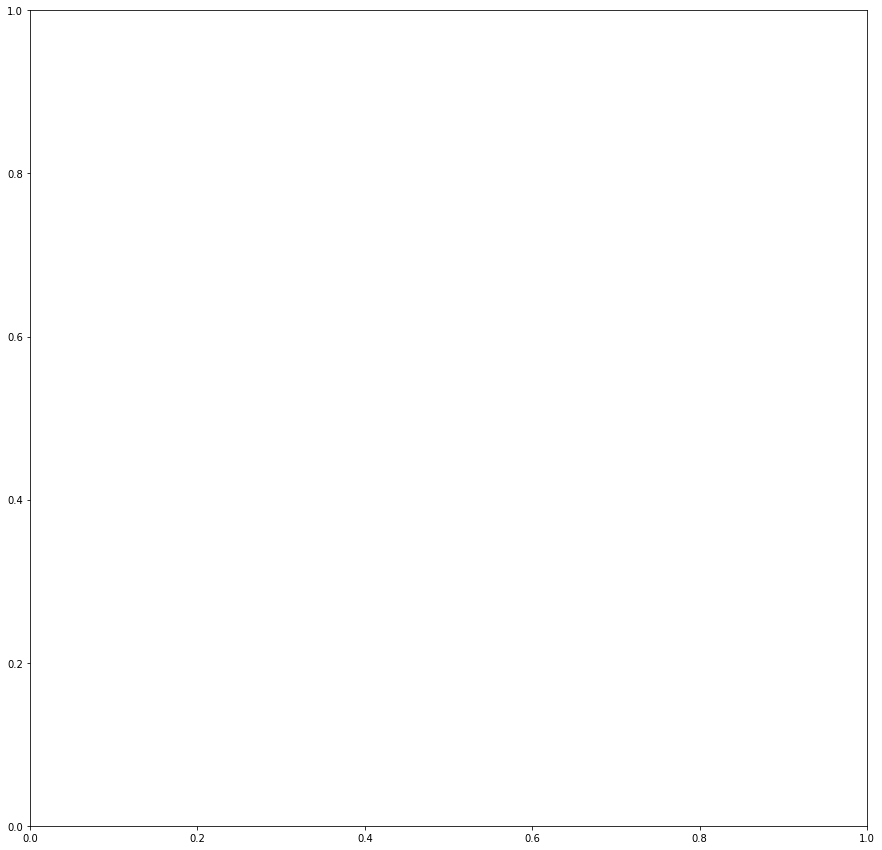

In [122]:
fig,ax = plt.subplots(figsize = (15,15))
syd_poas.plot(ax = ax, alpha = 0.3, color = 'brown')
plt.scatter(data = geo_df[geo_df['room_type'] == 'Private room'], x = 'longitude', y = 'latitude',s = 1,alpha= 0.5)
plt.scatter(data = geo_df[geo_df['room_type'] == 'Entire home/apt'], x = 'longitude', y = 'latitude', c= 'red',s = 1,alpha= 0.5)
plt.scatter(data = geo_df[geo_df['room_type'] == 'Shared room'], x = 'longitude', y = 'latitude', c= 'green',s = 1)





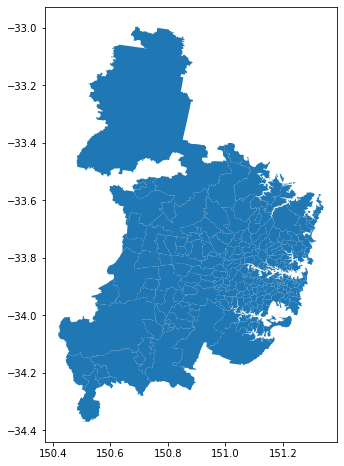

In [222]:
syd_poas = aus_poas.query('code >= 2000 & code <= 2200 | code in @post_list & (code < 2500 | code >= 2555 & code <= 2770 & code != 2758)|code == 2756 ')
fig,ax = plt.subplots(figsize = (8,8))
syd_poas.plot(ax = ax);

''

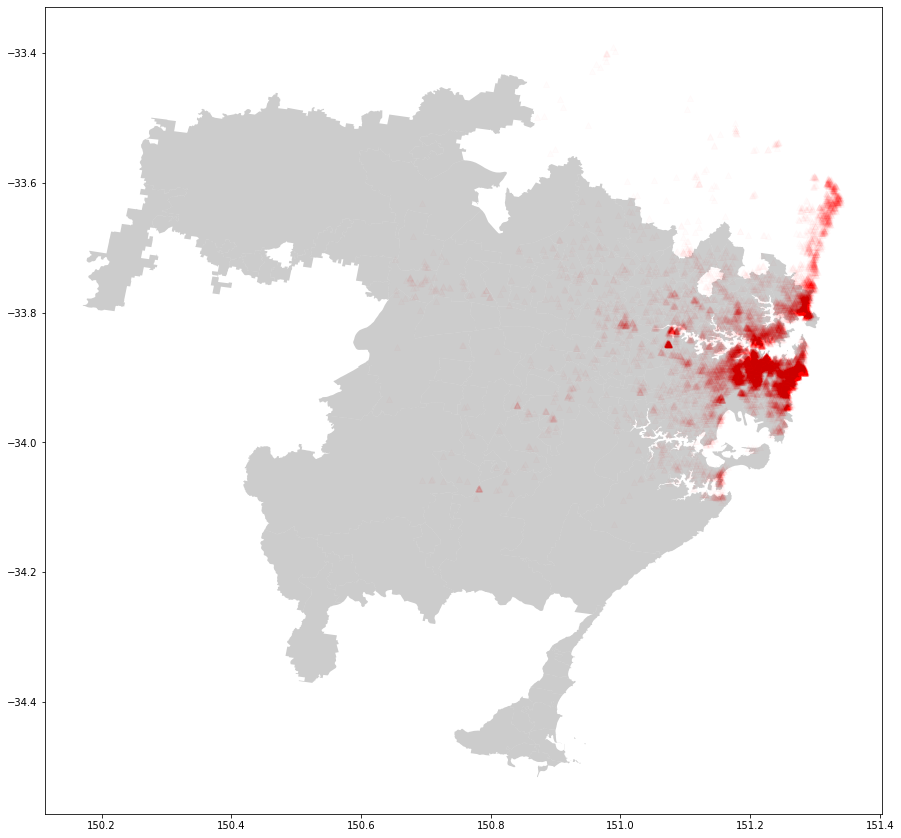

In [129]:
fig,ax = plt.subplots(figsize = (15,15))
syd_poas.plot(ax = ax, alpha = 0.4, color = 'grey')
geo_df[geo_df['room_type'] == 'Entire home/apt'].plot(ax=ax, color = 'red', marker = '^', label = '1', alpha = 0.01)

;

In [19]:
syd_post = pd.read_csv('sydney_postcode.csv')
post_list = syd_post[syd_post['District'] == 'Sydney']['Postcode'].values
post_list

array([2000, 2001, 2002, 2004, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025,
       2026, 2027, 2028, 2029, 2030, 2031, 2032, 2033, 2034, 2035, 2036,
       2037, 2038, 2039, 2040, 2041, 2042, 2043, 2044, 2045, 2046, 2047,
       2048, 2049, 2050, 2052, 2057, 2059, 2060, 2061, 2062, 2063, 2064,
       2065, 2066, 2067, 2068, 2069, 2070, 2071, 2072, 2074, 2075, 2076,
       2086, 2087, 2088, 2089, 2090, 2092, 2093, 2094, 2095, 2096, 2100,
       2109, 2110, 2111, 2112, 2113, 2114, 2115, 2116, 2117, 2118, 2119,
       2120, 2121, 2122, 2123, 2124, 2125, 2126, 2127, 2128, 2129, 2130,
       2131, 2132, 2133, 2134, 2135, 2136, 2137, 2138, 2139, 2140, 2141,
       2142, 2143, 2144, 2145, 2146, 2147, 2148, 2150, 2151, 2152, 2153,
       2154, 2155, 2156, 2158, 2160, 2161, 2162, 2163, 2164, 2165, 2166,
       2167, 2168, 2170, 2171, 2172, 2173, 2174, 2175, 2176, 2177, 2178,
       2179, 2190, 2191, 2192, 2193, 2194, 2195, 21

In [57]:
a = sl_df.host_id.value_counts().reset_index().copy()
b = list(a[a.host_id>1]['index'].values)

In [62]:
sl_df.query('host_id in @b').availability_365.mean()

133.32412801694787

In [64]:
sl_df.query('not host_id in @b').availability_365.mean()

77.12855619535082

In [28]:
len(sl_df.host_id.value_counts().values)

27219

In [12]:
print(sl_df.shape)
print(sr_df.shape)
print(sc_df.shape)

(36662, 16)
(446708, 2)
(13381265, 4)


In [13]:
sc_df.listing_id.value_counts()

29779763    365
21529503    365
813853      365
822017      365
18196517    365
           ... 
10176060    365
24550278    365
21904530    365
21830902    365
409800      365
Name: listing_id, Length: 36661, dtype: int64

In [186]:
sc_df[sc_df['listing_id'] == 12351]

,listing_id,date,available,price
1,12351,2019-08-17,t,$110.00
2,12351,2019-08-16,t,$110.00
3,12351,2019-08-15,t,$110.00
4,12351,2019-08-14,t,$110.00
5,12351,2019-08-13,t,$110.00
...,...,...,...,...
361,12351,2018-12-11,f,NaN
362,12351,2018-12-10,f,NaN
363,12351,2018-12-09,f,NaN
364,12351,2018-12-08,f,NaN


In [59]:
airbnb_with_code = gpd.sjoin(geo_df, syd_poas, how="inner", op='intersects')
airbnb_with_code.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,owner_own_rooms,geometry,index_right,POA_NAME,code,state
0,12351,Sydney City & Harbour at the door,17061,Stuart,Sydney,-33.865153,151.191896,Private room,100,2,...,2018-11-21,4.83,2,187,Medium,POINT (151.19190 -33.86515),1704,2009,2009,None
27,73639,Sydney City Home with Harbour Views,17061,Stuart,Sydney,-33.865854,151.192333,Private room,89,2,...,2018-11-27,3.90,2,221,Medium,POINT (151.19233 -33.86585),1704,2009,2009,None
119,332960,270° Iconic Sydney Harbour View Balcony Room,1756420,Sydney Harbour,Sydney,-33.867881,151.190740,Private room,108,1,...,2018-07-17,0.29,3,52,Medium,POINT (151.19074 -33.86788),1704,2009,2009,None
120,333002,270° Iconic Sydney Harbour View King Room,1756420,Sydney Harbour,Sydney,-33.865588,151.189968,Private room,115,1,...,2018-07-13,0.23,3,52,Medium,POINT (151.18997 -33.86559),1704,2009,2009,None
412,842792,The Penthouse Darling Harbour,4400248,Leon,Sydney,-33.870977,151.197330,Entire home/apt,676,3,...,2018-11-25,1.50,1,283,Low,POINT (151.19733 -33.87098),1704,2009,2009,None


In [393]:
b = airbnb_with_code.groupby('code').price.mean().reset_index()

In [394]:
a = syd_poas.merge(b, on='code')
#a = a[a['POA_NAME_y'] >=10]
a

,POA_NAME,code,state,geometry,price
0,2570,2570,None,"POLYGON ((150.44723 -34.10046, 150.44720 -34.1...",98.000000
1,2745,2745,None,"POLYGON ((150.61322 -33.86416, 150.61317 -33.8...",323.538462
2,2749,2749,None,"POLYGON ((150.69176 -33.64544, 150.69168 -33.6...",331.888889
3,2750,2750,None,"POLYGON ((150.71266 -33.75426, 150.71238 -33.7...",136.250000
4,2753,2753,None,"POLYGON ((150.68213 -33.57439, 150.68240 -33.5...",120.000000
...,...,...,...,...,...
217,2105,2105,None,"MULTIPOLYGON (((151.28002 -33.65191, 151.28002...",338.736842
218,2106,2106,None,"MULTIPOLYGON (((151.30199 -33.64917, 151.30204...",522.311111
219,2107,2107,None,"POLYGON ((151.31674 -33.62441, 151.31674 -33.6...",508.773019
220,2108,2108,None,"MULTIPOLYGON (((151.21826 -33.60125, 151.21826...",752.166667


<Figure size 576x576 with 0 Axes>

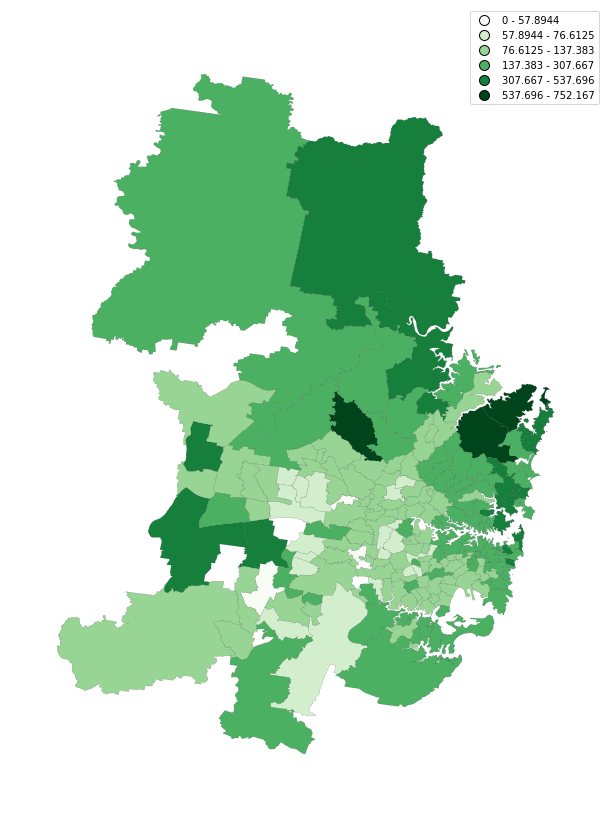

In [395]:
plt.figure(figsize = (8,8))
gplt.choropleth(
    a, hue='price', 
    edgecolor='k', linewidth=0.1,
    cmap='Greens', legend=True,
    scheme='Percentiles',
figsize = (15,15))